In [1]:
from spotipy.oauth2 import SpotifyClientCredentials #To access authorised Spotify data
from tqdm import tqdm_notebook
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import imblearn
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from numpy import where


Bad key "text.kerning_factor" on line 4 in
/opt/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [79]:
#reading in my data, creating DataFrame
data = pd.read_csv('song_data.csv', index_col='id')

In [4]:
data.head()

,danceability,energy,key,loudness,mode,speechiness,liveness,valence,tempo,duration_ms,time_signature,acousticness,instrumentalness,hit
id,,,,,,,,,,,,,,
spotify:track:7ouSt7aDTUf5CiuMt0APSh,0.680,0.887,11,-2.950,0,0.2310,0.179,0.4430,74.090,288000,4,0.013500,0.000000,0
spotify:track:54sHRG6XMAbO6IiQR8HXdK,0.845,0.457,1,-11.548,0,0.0538,0.254,0.6000,120.055,152387,4,0.131000,0.000000,0
spotify:track:75GQ8vEI9NUWfh5dknxKxW,0.273,0.995,11,-3.627,0,0.2810,0.124,0.0515,122.519,299347,4,0.000094,0.264000,0
spotify:track:3rJAP9G6hjx2kN8Jsvas09,0.246,0.510,2,-6.637,1,0.0360,0.325,0.1010,159.915,328933,4,0.007990,0.000046,0
spotify:track:4RBVFZCAfBn44uP4W9aF6J,0.535,0.125,10,-24.876,0,0.4920,0.757,0.5050,97.516,298773,3,0.872000,0.000000,0


In [60]:
data.shape

(45536, 14)

In [62]:
data['hit'].value_counts()

0    45000
1      536
Name: hit, dtype: int64

In [80]:
#creating seperate DataFrames for the hit and non-hit songs for easier EDA
df_hits = data[data['hit'] == 1]
df_flops = data[data['hit'] == 0]

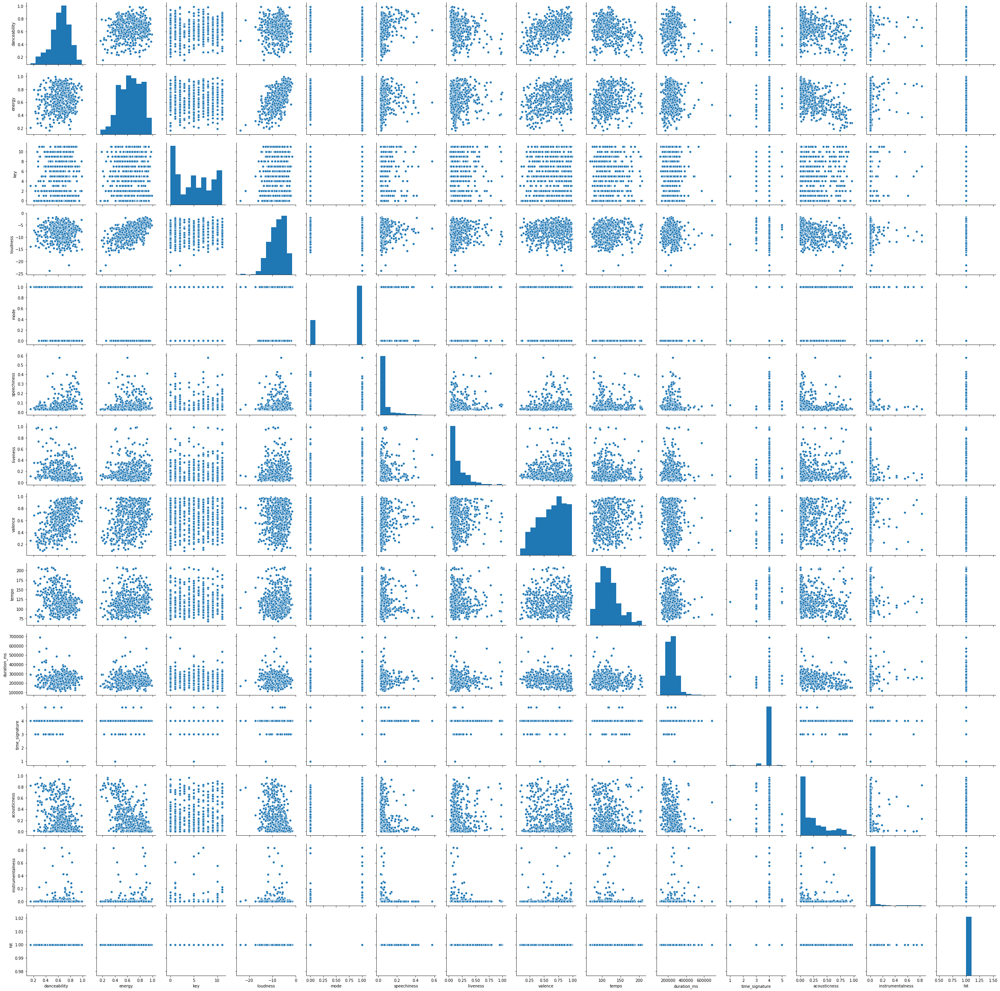

In [66]:
#pairplot of features of hit songs
sns.pairplot(data=df_hits)
plt.show()

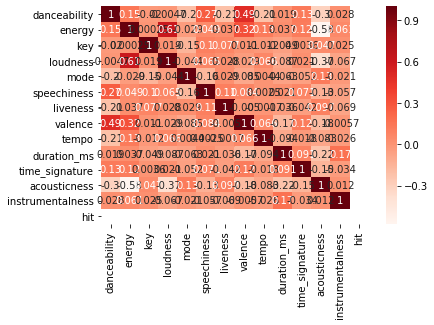

In [68]:
#heatmap of correlation between features of hit songs
sns.heatmap(df_hits.corr(), annot=True, cmap='Reds')
plt.show()

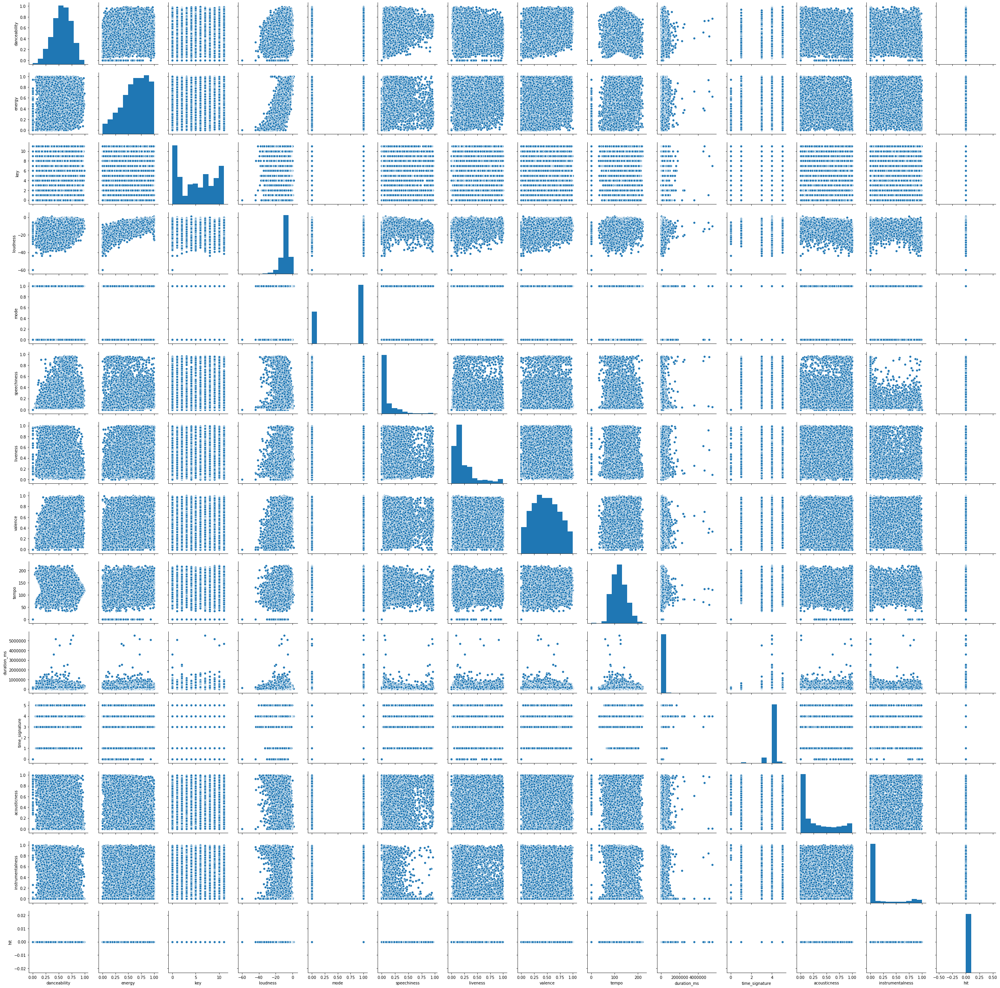

In [69]:
#pairplot of features of non-hit songs
sns.pairplot(data=df_flops)
plt.show()

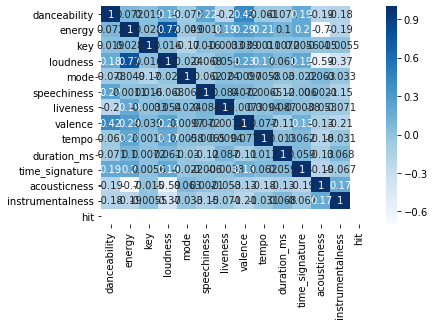

In [71]:
#heatmap of correlation between features of non-hit songs
sns.heatmap(df_flops.corr(), annot=True, cmap='Blues')
plt.show()

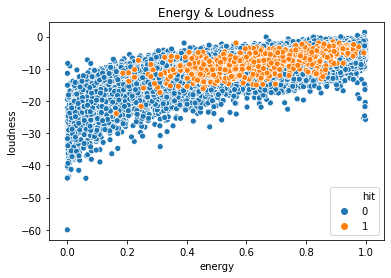

In [81]:
#scatterplot of the highest-correlated features [Energy and Loudness] of all songs, colored by whether or not they are hits
sns.scatterplot(x=data['energy'],y=data['loudness'], hue=data['hit'])
plt.title("Energy & Loudness")
plt.show()

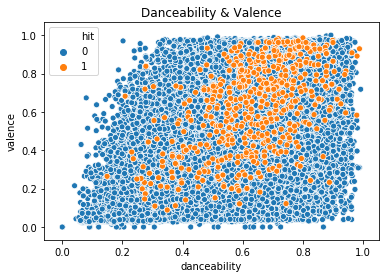

In [77]:
#Scatterplot of another set of highly correlated features, colored by whether or not they are hits
sns.scatterplot(x=data['danceability'],y=data['valence'], hue=data['hit'])
plt.title('Danceability & Valence')
plt.show()

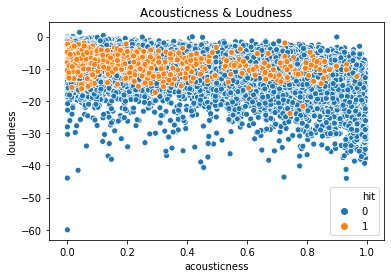

In [78]:
#scatterplot of features with low, negative correlation, colored by whether or not they are hits
sns.scatterplot(x=data['acousticness'],y=data['loudness'], hue=data['hit'])
plt.title("Acousticness & Loudness")
plt.show()

In [5]:
#seperating data into X and y
cols = list(data.columns)[:-1]
X = data[cols]
y=data['hit']

In [6]:
#Using SMOTE to balance the dataset 
from imblearn.over_sampling import SMOTE
from collections import Counter

oversample = SMOTE()
X, y = oversample.fit_resample(X, y)


In [7]:
y.value_counts()

1    45000
0    45000
Name: hit, dtype: int64

In [27]:
#Using train_test_split
from sklearn.model_selection import train_test_split

In [28]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)

In [16]:
#Beginning with a LogisticRegression model, using RandomizedSearchCV; importing relevant packages
from scipy.stats import loguniform
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import RandomizedSearchCV 

#creating the model and the cross-validation splits
model = LogisticRegression()
cv = RepeatedStratifiedKFold(n_splits = 10, n_repeats=3, random_state=42)

#creating a dictionary of LogReg hyperparameters
space = dict()
space['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
space['penalty'] = ['none', 'l1', 'l2', 'elasticnet']
space['C'] = loguniform(1e-5, 100)

#performing the RandomizedSearchCV
search = RandomizedSearchCV(model, space, n_iter=500, scoring='precision', n_jobs=-1, cv=cv, random_state=42)

#fitting the model
result = search.fit(X, y)




/opt/anaconda3/lib/python3.7/site-packages/scipy/optimize/linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/opt/anaconda3/lib/python3.7/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/opt/anaconda3/lib/python3.7/site-packages/scipy/optimize/linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/opt/anaconda3/lib/python3.7/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/opt/anaconda3/lib/python3.7/site-packages/scipy/optimize/linesearch.py:466: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

In [17]:
print(result.best_score_)

0.7087985679918124


In [18]:
print('Best Hyperparameters: %s' % result.best_params_)

Best Hyperparameters: {'C': 0.03489214708297657, 'penalty': 'l2', 'solver': 'newton-cg'}


In [83]:
#importing KNNClassifier
from sklearn.neighbors import KNeighborsClassifier

#creating model
KNN = KNeighborsClassifier()

#creating dictionary of parameters
n_neighbors = range(1, 21)
weights = ['uniform', 'distance']
metric = ['euclidean', 'manhattan', 'minkowski']
n_space['n_neighbors'] = n_neighbors
n_space['weights'] = weights
n_space['metric'] = metric
KNN_grid = dict(n_neighbors=n_neighbors, weights=weights, metric=metric)

#performing the RandomizedSearchCV
KNN_search = RandomizedSearchCV(KNN, KNN_grid, n_iter=50, scoring='precision', n_jobs=-1, cv=cv, random_state=42)
KNN_result = KNN_search.fit(X_train,y_train)

#printing best results, and then all other results
print("Best: %f using %s" % (KNN_result.best_score_, KNN_result.best_params_))
KNN_means = KNN_result.cv_results_['mean_test_score']
KNN_stds = KNN_result.cv_results_['std_test_score']
KNN_params = KNN_result.cv_results_['params']

for mean, stdev, param in zip(KNN_means, KNN_stds, KNN_params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.820921 using {'weights': 'uniform', 'n_neighbors': 2, 'metric': 'manhattan'}
0.742546 (0.005208) with: {'weights': 'uniform', 'n_neighbors': 3, 'metric': 'manhattan'}
0.754831 (0.005886) with: {'weights': 'distance', 'n_neighbors': 4, 'metric': 'manhattan'}
0.732900 (0.005685) with: {'weights': 'uniform', 'n_neighbors': 3, 'metric': 'euclidean'}
0.742295 (0.005665) with: {'weights': 'distance', 'n_neighbors': 8, 'metric': 'manhattan'}
0.713511 (0.005480) with: {'weights': 'uniform', 'n_neighbors': 14, 'metric': 'euclidean'}
0.709106 (0.004875) with: {'weights': 'uniform', 'n_neighbors': 13, 'metric': 'manhattan'}
0.729353 (0.005154) with: {'weights': 'distance', 'n_neighbors': 17, 'metric': 'manhattan'}
0.748225 (0.005705) with: {'weights': 'uniform', 'n_neighbors': 6, 'metric': 'euclidean'}
0.765860 (0.005160) with: {'weights': 'uniform', 'n_neighbors': 1, 'metric': 'manhattan'}
0.724010 (0.005662) with: {'weights': 'distance', 'n_neighbors': 14, 'metric': 'minkowski'}
0.72609

In [29]:
#importing the Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier

#Creating the Model
forest=RandomForestClassifier()

#creating dictionary of parameters
n_estimators = [100, 300, 500, 800, 1200]
max_depth = [5, 8, 15, 25, 30]
min_samples_split = [2, 5, 10, 15, 100]
min_samples_leaf = [1, 2, 5, 10] 
hyperparams = dict(n_estimators = n_estimators, max_depth = max_depth,  
              min_samples_split = min_samples_split, 
             min_samples_leaf = min_samples_leaf)

#performing a GridSearch
grid_forest = GridSearchCV(forest, hyperparams, cv = 3, verbose = 1, 
                      n_jobs = -1, scoring='precision')

#fitting the model
bestF = grid_forest.fit(X_train, y_train)

Fitting 3 folds for each of 500 candidates, totalling 1500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 33.1min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed: 86.8min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed: 201.4min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 494.4min
[Parallel(n_jobs=-1)]: Done 1500 out of 1500 | elapsed: 622.8min finished


In [30]:
#printing results
print("Best: %f using %s" % (bestF.best_score_, bestF.best_params_))
bestF_means = bestF.cv_results_['mean_test_score']
bestF_stds = bestF.cv_results_['std_test_score']
bestF_params = bestF.cv_results_['params']

for mean, stdev, param in zip(bestF_means, bestF_stds, bestF_params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.944897 using {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 1200}
0.739170 (0.002278) with: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
0.738339 (0.002721) with: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
0.737755 (0.003827) with: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 500}
0.738049 (0.003614) with: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 800}
0.737708 (0.002661) with: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 1200}
0.738199 (0.002452) with: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}
0.736643 (0.004082) with: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 300}
0.737626 (0.003486) with: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 500}
0.7

In [37]:
#creating and fitting model with optmized hyperparameters
best_clf = RandomForestClassifier(class_weight='balanced', max_depth=30, min_samples_leaf=1, min_samples_split=5, n_estimators=1200, random_state=42)
best_clf.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=30,
                       min_samples_split=5, n_estimators=1200, random_state=42)

In [38]:
#getting predictions
y_pred = best_clf.predict(X_test)

In [39]:
#cross_val_score for cross-validation
cross_val_score(best_clf, X_train, y_train, cv=5, scoring='precision')

array([0.94640264, 0.94904037, 0.94453228, 0.94925136, 0.95441823])

In [40]:
#creating a confusion matrix
metrics.confusion_matrix(y_test, y_pred, labels=[0,1])

array([[8603,  401],
       [  34, 8962]])

In [59]:
#printing other potentially relevant metrics
from sklearn.metrics import accuracy_score
print(precision_score(y_test, y_pred))
print(recall_score(y_test, y_pred))
print(f1_score(y_test, y_pred))
print(accuracy_score(y_test, y_pred))

0.9571718466303535
0.996220542463317
0.9763058990141075
0.9758333333333333


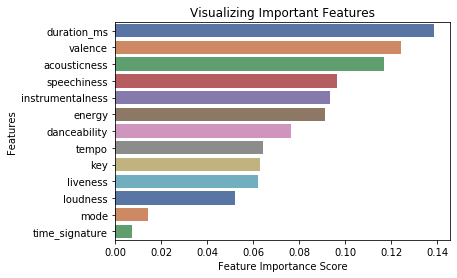

In [42]:
#creating a plot to show how the features are 'weighted' by the model

feature_imp = pd.Series(best_clf.feature_importances_, index=list(X.columns)).sort_values(ascending=False)

sns.barplot(x=feature_imp, y = feature_imp.index, palette='deep')
plt.xlabel("Feature Importance Score")
plt.ylabel("Features")
plt.title("Visualizing Important Features")
plt.show()

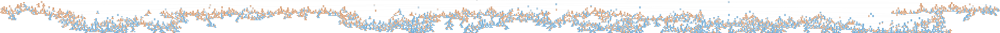

In [57]:
#creating and saving a visuzalition of the Random Forest
estimator = best_clf.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = X.columns,
                class_names = "hit",
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')
